In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

#This is the folder path, replace to your own local path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 3\WindowMaster\Weather'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year3
['OT_Y3.csv', 'Rain_Y3.csv', 'WD_Y3.csv', 'WS_Y3.csv']


In [3]:
#IMPORTANT: If you get an error in reading the files do the following:
import os
Lst = []
for i in range(0, len(file_list)):
    # Construct the full path for each file
    file_path = os.path.join(dir_path, file_list[i])
    # Use the full path to read the CSV file
    data = pd.read_csv(file_path, parse_dates=['Time'], index_col=[0])
    print(len(data))
    Lst.append(data)

41118
1070
225107
135552


In [4]:
Lst_Slab = []
Lst_name = []
#Initialize an empty DataFrame to compile resampled data from each DataFrame in Lst
Weather = pd.DataFrame()
res = 1
#This part will take care of timestamp corrections, ensuring the output is always EST!
for i in range(0,len(Lst)):
    #Convert the index of the current DataFrame to datetime format with UTC timezone    
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    #Convert the timezone of the index from UTC to US/Eastern
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    #Resample the DataFrame to a 1-minute frequency using the mean for aggregation. (This is for analysis)
    #forward fill missing data resulting from the resampling.    
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    #Extract the name of the first column of the DataFrame.          
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    #Convert the specified column's data to numeric to ensure consistency for calculations.
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_Slab.append(Z.tolist())
    #Create a new column in 'Weather' with the name of the current zone.
    Weather[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Weather

C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\1845719064.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\1845719064.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\1845719064.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\1845719064.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()


,"Weather data, Outdoor temperature (F)","Weather data, Rain","Weather data, Wind direction","Weather data, Wind speed (m/s)"
Time,,,,
2022-05-31 20:00:00-04:00,59.576000,NaN,129.857023,0.1
2022-05-31 20:01:00-04:00,59.576000,NaN,129.857023,0.1
2022-05-31 20:02:00-04:00,59.576000,NaN,129.857023,0.1
2022-05-31 20:03:00-04:00,59.576000,NaN,129.857023,0.1
2022-05-31 20:04:00-04:00,59.576000,NaN,129.857023,0.1
...,...,...,...,...
2023-05-31 19:48:00-04:00,65.642001,NaN,280.000000,1.6
2023-05-31 19:49:00-04:00,65.642001,NaN,280.000000,1.5
2023-05-31 19:50:00-04:00,65.642001,NaN,280.000000,1.5


<Axes: xlabel='Time'>

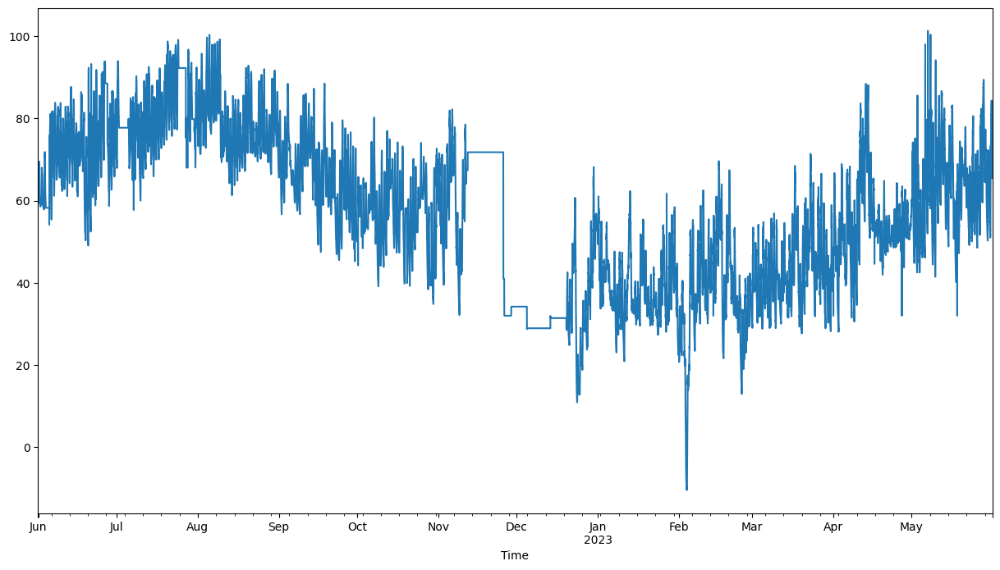

In [5]:
Weather["Weather data, Outdoor temperature (F)"].plot(figsize=(15, 8))

<Axes: xlabel='Time'>

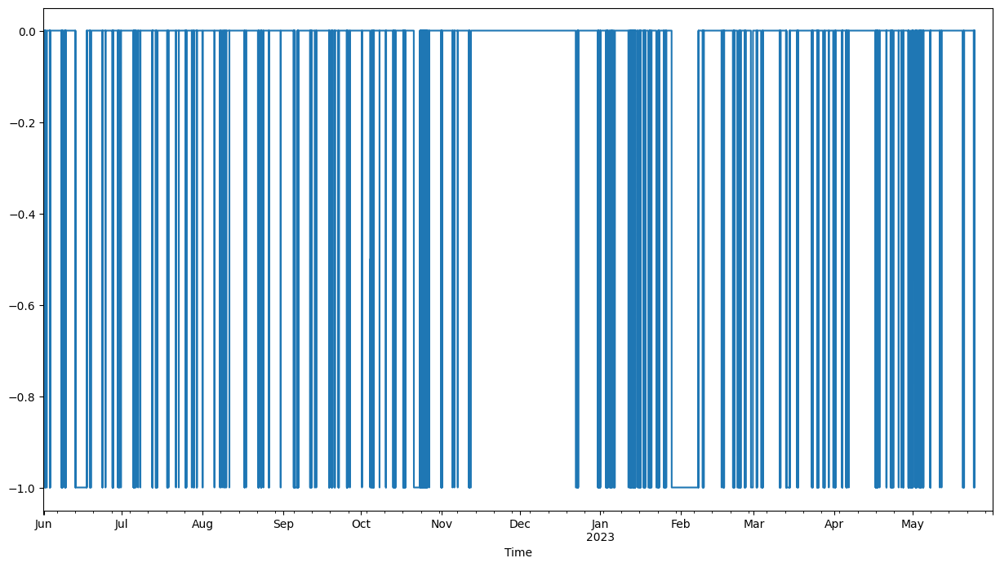

In [6]:
Weather["Weather data, Rain"].plot(figsize=(15, 8))

<Axes: xlabel='Time'>

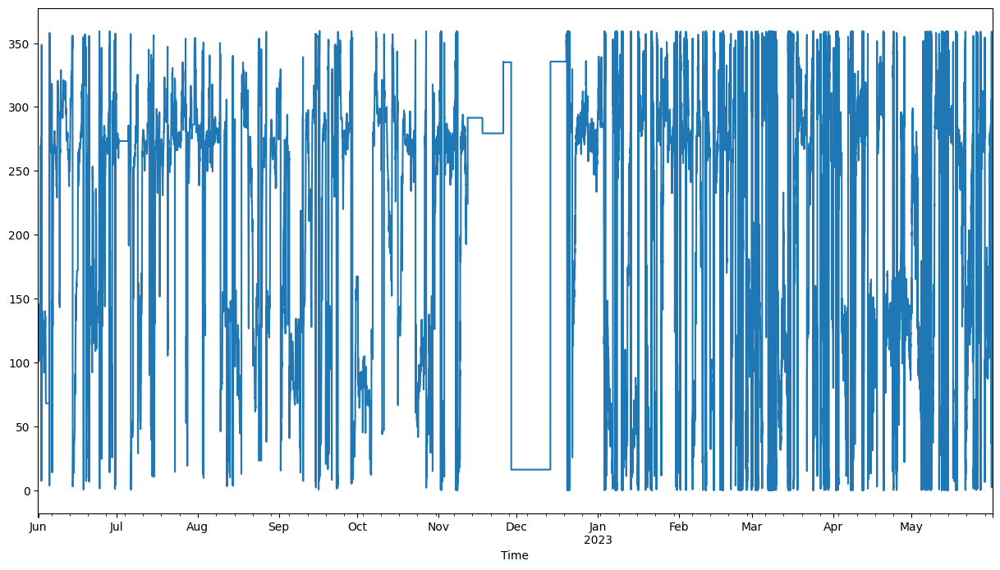

In [7]:
Weather["Weather data, Wind direction"].plot(figsize=(15, 8))

<Axes: xlabel='Time'>

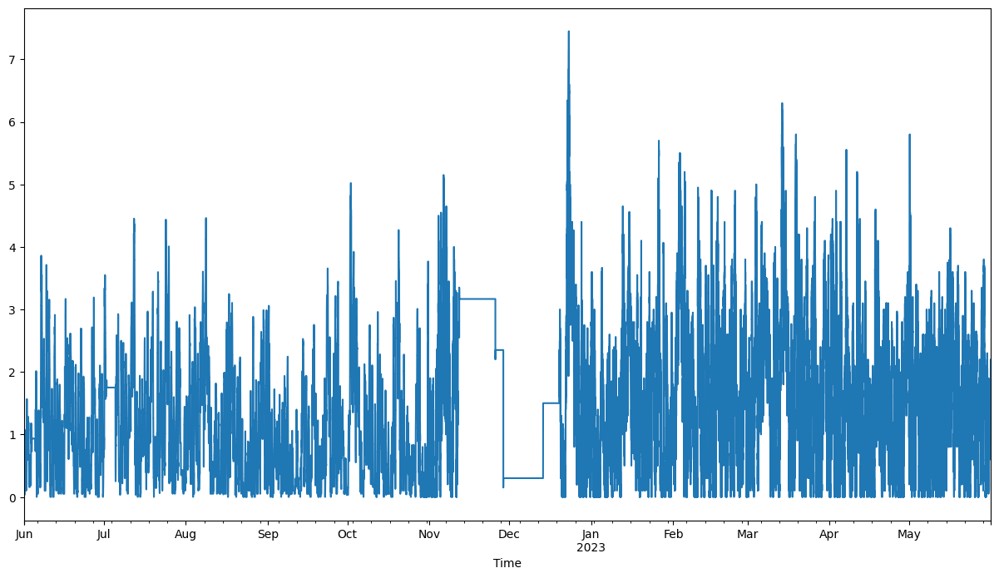

In [8]:
Weather["Weather data, Wind speed (m/s)"].plot(figsize=(15, 8))

In [9]:
#Fill all missing values with 0
Weather['Weather data, Rain'] =  Weather['Weather data, Rain'].fillna(0) 

<Axes: xlabel='Time'>

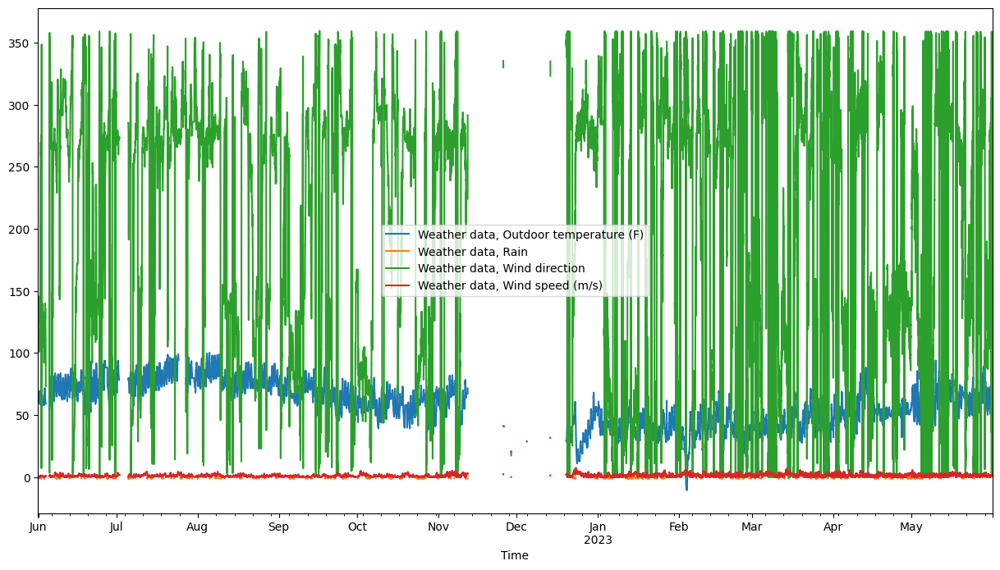

In [10]:
def replace_repeated_values_with_nan(df, min_streak=10):
    for column in df.columns:
        # Track when the value changes
        changes = df[column].ne(df[column].shift())
        
        # Create a group for each sequence of repeating values
        groups = changes.cumsum()
        
        # Count the size of each group and filter groups with size greater than min_streak
        filtered_groups = groups.map(groups.value_counts()).where(lambda x: x > min_streak)
        
        # Replace those groups' values with np.nan
        df.loc[filtered_groups.notna(), column] = np.nan
        
# Apply the function to replace repeated values longer than 24
replace_repeated_values_with_nan(Weather, min_streak=24*60)
Weather.plot(figsize=(15, 8))

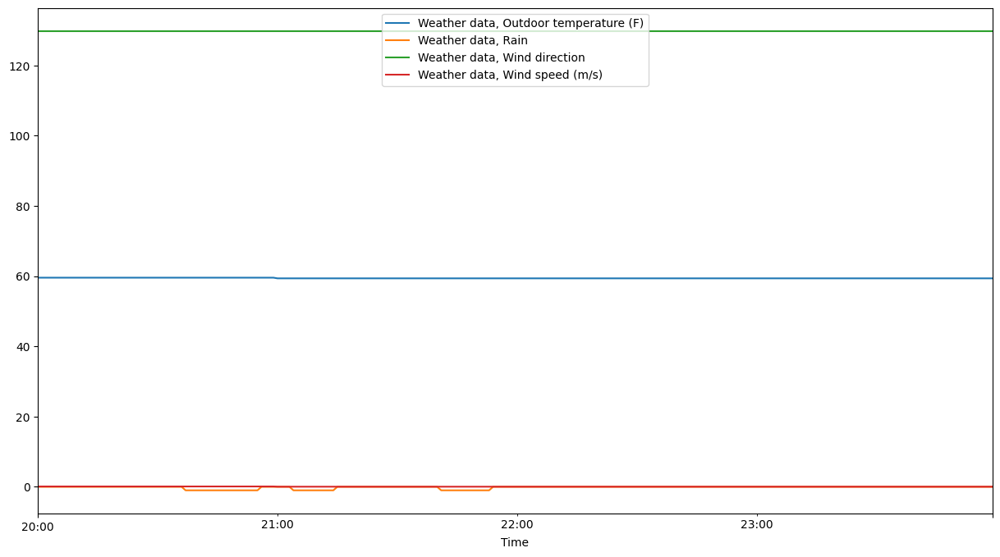

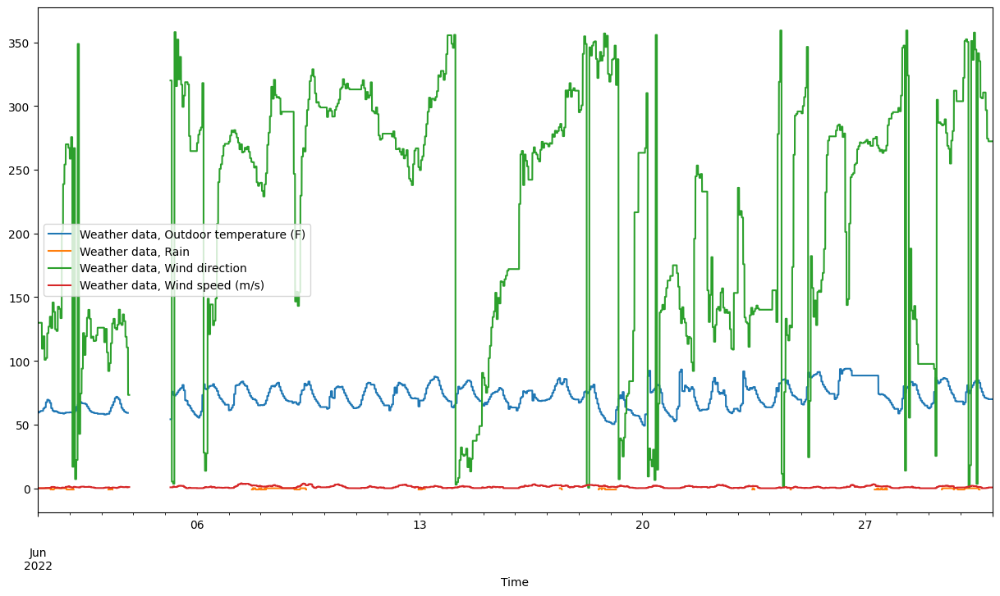

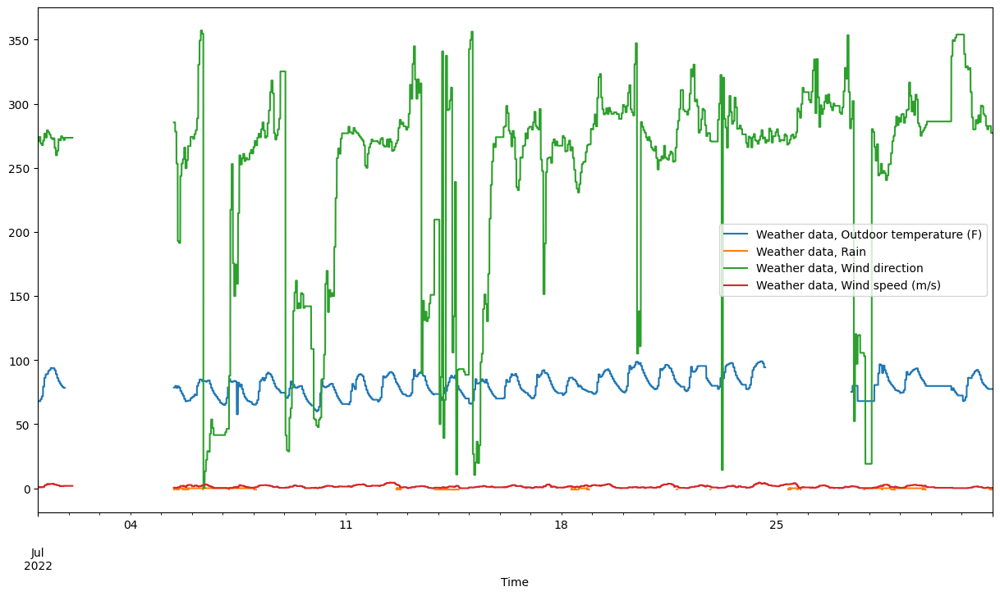

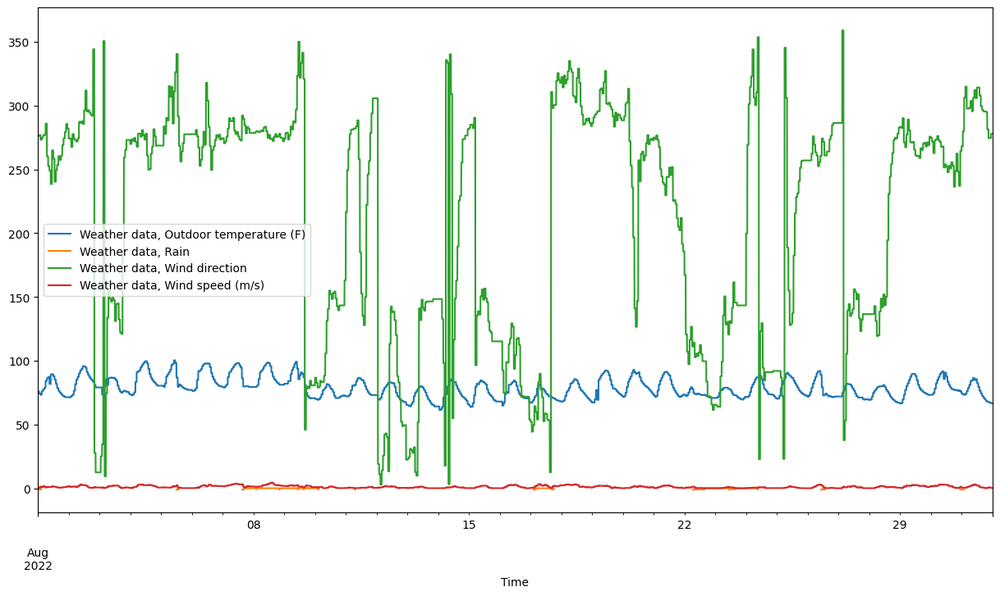

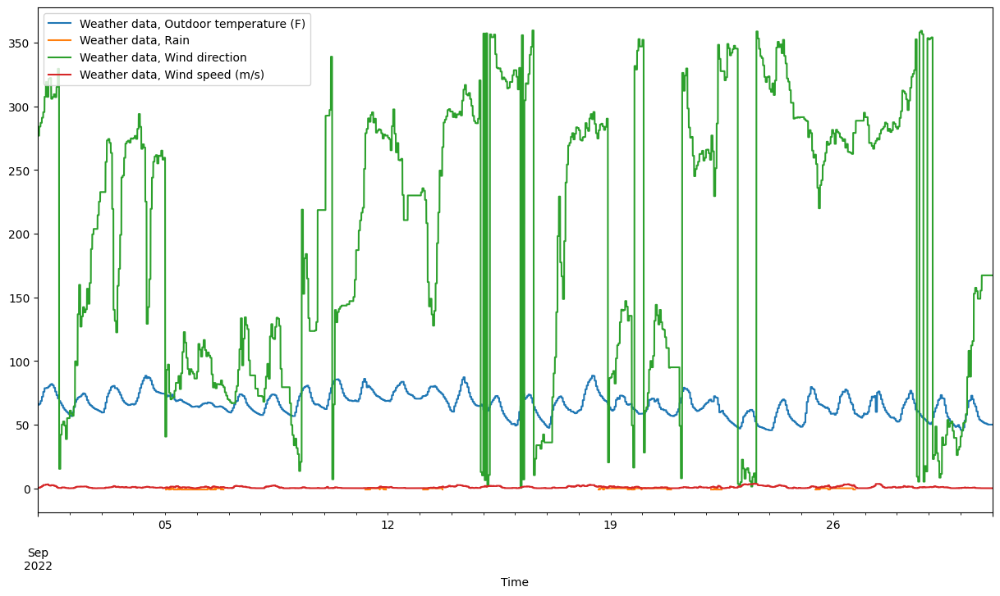

...

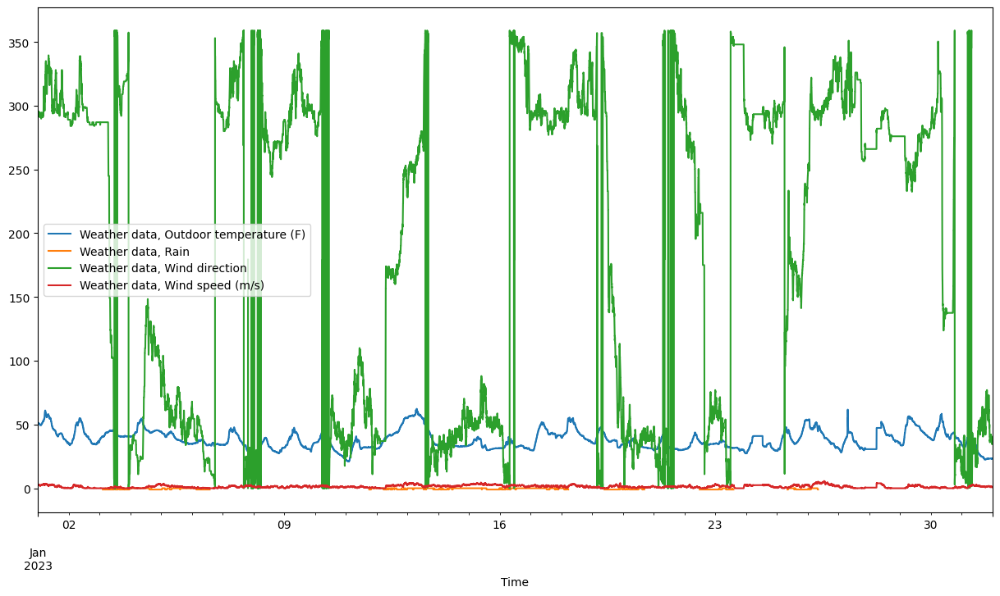

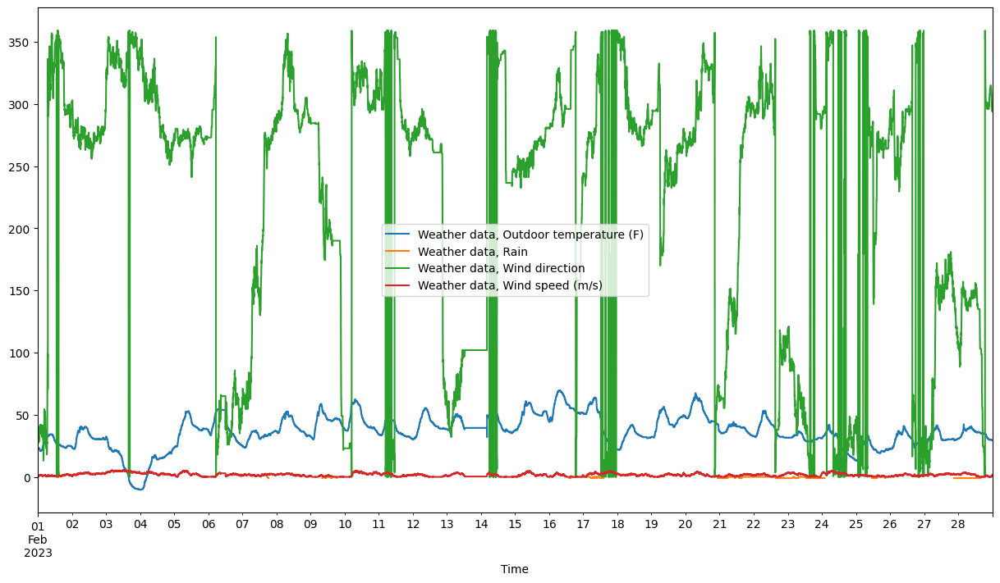

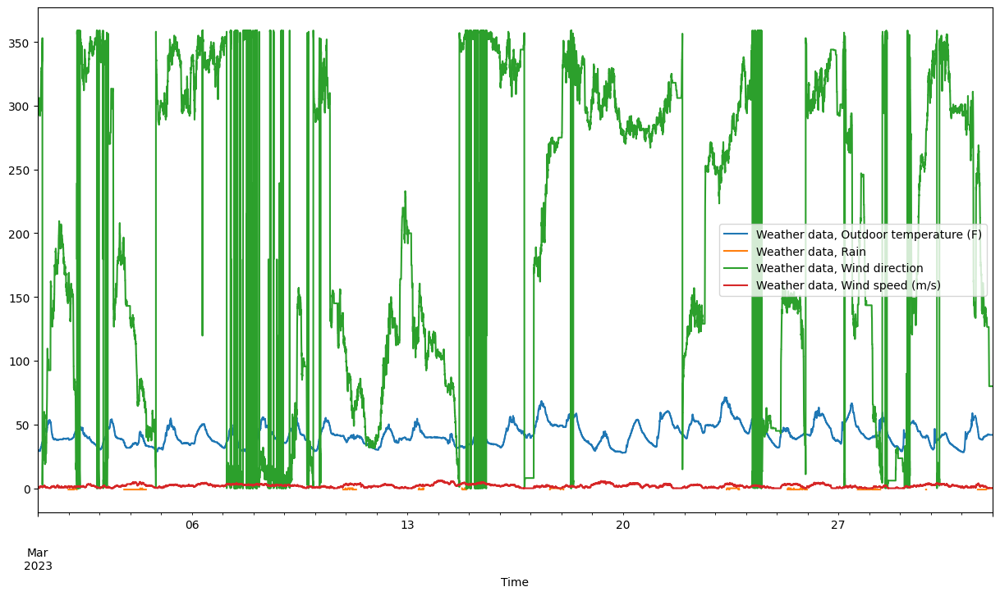

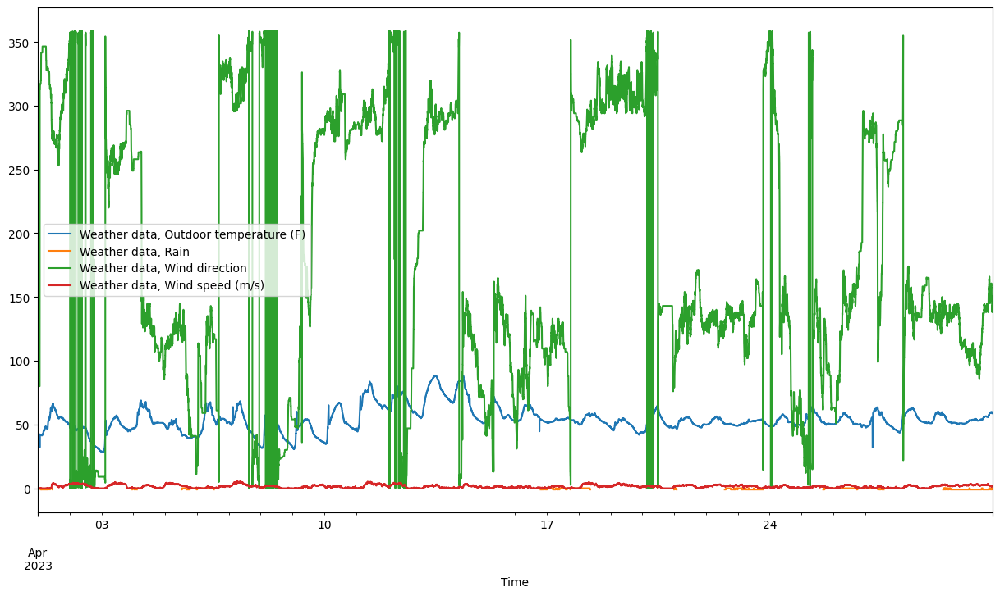

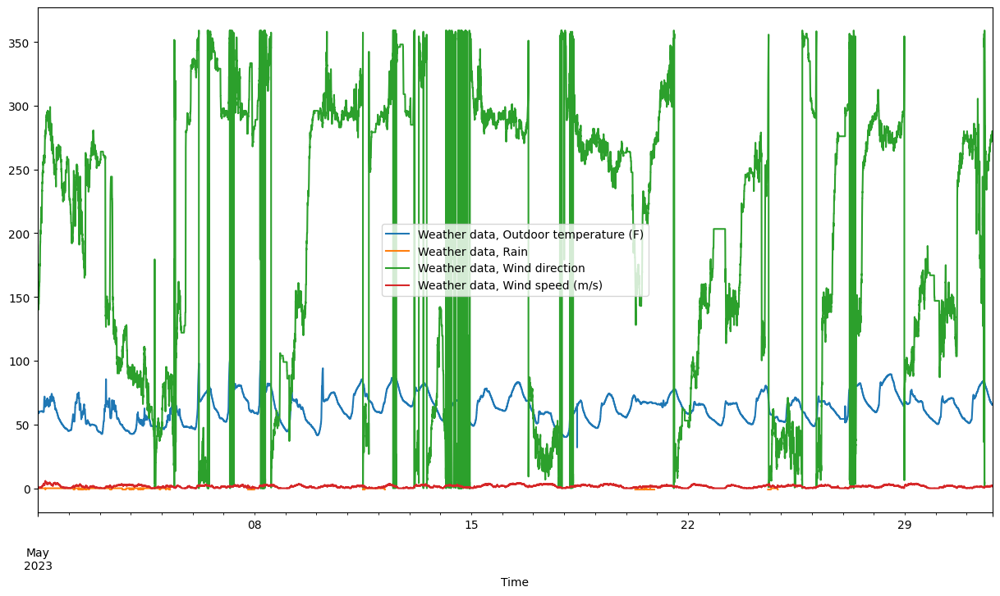

In [11]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Weather.groupby([Weather.index.year, Weather.index.month]):

    group.plot(figsize=(15, 8))

In [11]:
# Process to hourly
#.pad() is the same as a forward fill(.ffill()), it will propagate the last existing value to a missing value
Weather = Weather.resample("H").mean().pad()
Weather

C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\3045209737.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  Weather = Weather.resample("H").mean().pad()
C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\3045209737.py:3: FutureWarning: DataFrame.pad/Series.pad is deprecated. Use DataFrame.ffill/Series.ffill instead
  Weather = Weather.resample("H").mean().pad()


,"Weather data, Outdoor temperature (F)","Weather data, Rain","Weather data, Wind direction","Weather data, Wind speed (m/s)"
Time,,,,
2022-05-31 20:00:00-04:00,59.576000,-0.316667,129.857023,0.100000
2022-05-31 21:00:00-04:00,59.382500,-0.400000,129.857023,0.033333
2022-05-31 22:00:00-04:00,59.382500,0.000000,129.857023,0.033333
2022-05-31 23:00:00-04:00,59.382500,0.000000,129.857023,0.033333
2022-06-01 00:00:00-04:00,59.382500,0.000000,129.857023,0.033333
...,...,...,...,...
2023-05-31 15:00:00-04:00,77.627600,-0.382353,245.234722,1.173333
2023-05-31 16:00:00-04:00,74.065400,-0.382353,253.788333,1.425833
2023-05-31 17:00:00-04:00,70.684400,-0.382353,261.318889,1.580833


In [12]:
missing_percentage = Weather.isna().mean() * 100

# Print the result
print(missing_percentage)

Weather data, Outdoor temperature (F)    0.0
Weather data, Rain                       0.0
Weather data, Wind direction             0.0
Weather data, Wind speed (m/s)           0.0
dtype: float64


In [13]:
#Produce the csv
Weather.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Year3\Weather_Year3.csv', index=True)

In [14]:
#Missing Data Check
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in Weather.columns:
    for start, end in find_nan_sequences(Weather[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

In [15]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year3\Missing_periods_Weather_Year3.csv', index=False)

In [ ]:
#-----------------------end here for weather-----------------------------#

In [13]:
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 3\Gund weather station\Weather_data_gund_Y3.csv'


In [14]:
yearly_data = pd.read_csv(dir_path, parse_dates=['Timestamp'], index_col=[0])

In [15]:
yearly_data.columns.values

array(['Air temperature (gund, ℃)', 'Relative humidity (gund, %)',
       'Wind direction (gund, °)', 'Wind speed (gund, m/s)',
       'Pressure (gund, mbar)', 'Solar radiation (gund, W/m^2)'],
      dtype=object)

In [16]:
yearly_data

,"Air temperature (gund, ℃)","Relative humidity (gund, %)","Wind direction (gund, °)","Wind speed (gund, m/s)","Pressure (gund, mbar)","Solar radiation (gund, W/m^2)"
Timestamp,,,,,,
2022-06-01 00:00:00,13.21,84.2,111,0.5,1013.5,1
2022-06-01 00:05:00,12.58,87.1,107,0.0,1013.6,1
2022-06-01 00:10:00,12.49,88.9,102,0.5,1013.8,1
2022-06-01 00:15:00,12.53,89.3,105,0.5,1013.9,1
2022-06-01 00:20:00,12.58,88.7,76,0.0,1013.9,1
...,...,...,...,...,...,...
2023-05-31 23:35:00,17.87,68.8,185,1.0,1016.1,1
2023-05-31 23:40:00,17.80,68.9,177,1.0,1016.2,1
2023-05-31 23:45:00,17.68,69.2,173,0.5,1016.2,1


<Axes: xlabel='Timestamp'>

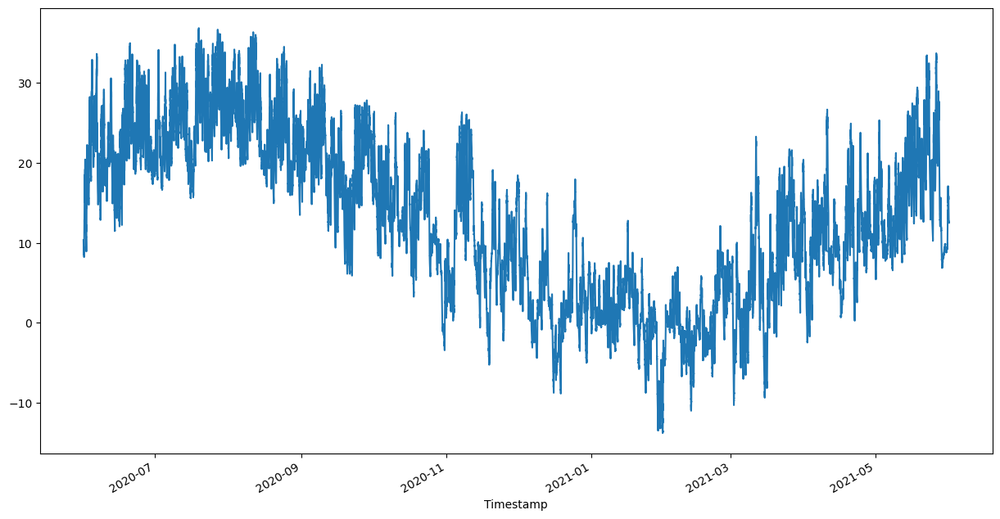

In [13]:
yearly_data['Air temperature (gund, ℃)'].plot(figsize=(15, 8))

In [15]:
AirTemp = yearly_data['Air temperature (gund, ℃)']

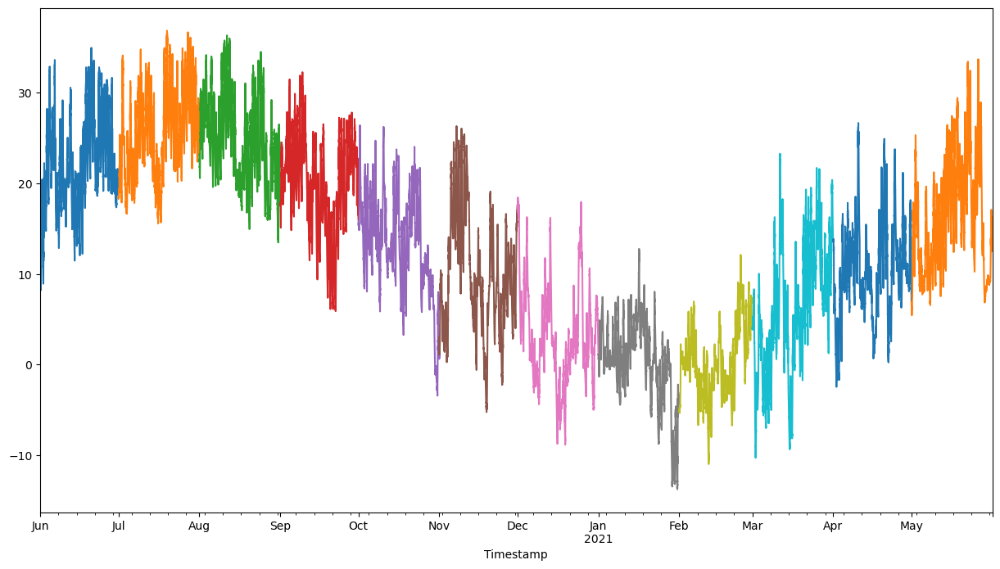

In [16]:
for (year, month), group in AirTemp.groupby([AirTemp.index.year, AirTemp.index.month]):

    group.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

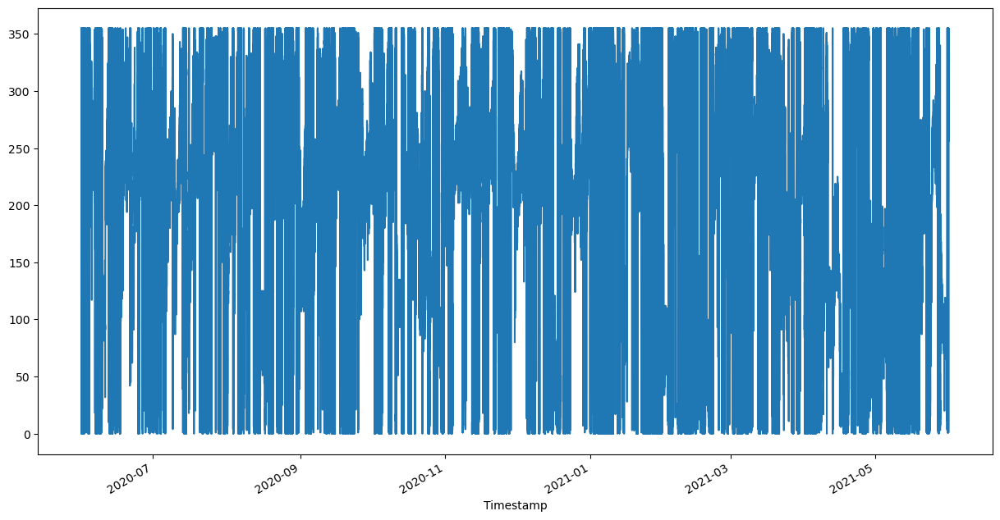

In [19]:
# ['Air temperature (gund, ℃)', 'Relative humidity (gund, %)',
#        'Wind direction (gund, °)', 'Wind speed (gund, m/s)',
#        'Pressure (gund, mbar)', 'Solar radiation (gund, W/m^2)']

AirTemp = AirTemp[:10000]

yearly_data['Wind direction (gund, °)'].plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

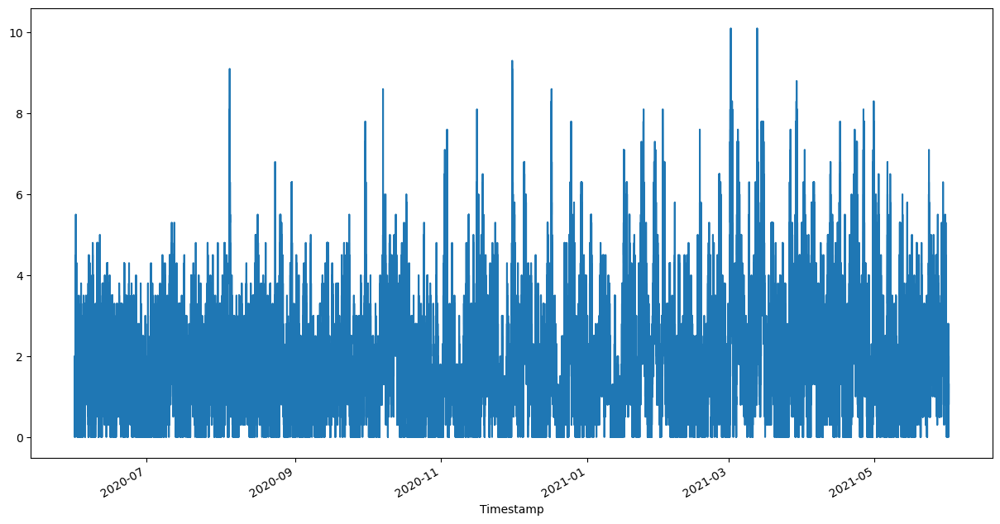

In [20]:
yearly_data['Wind speed (gund, m/s)'].plot(figsize=(15, 8))

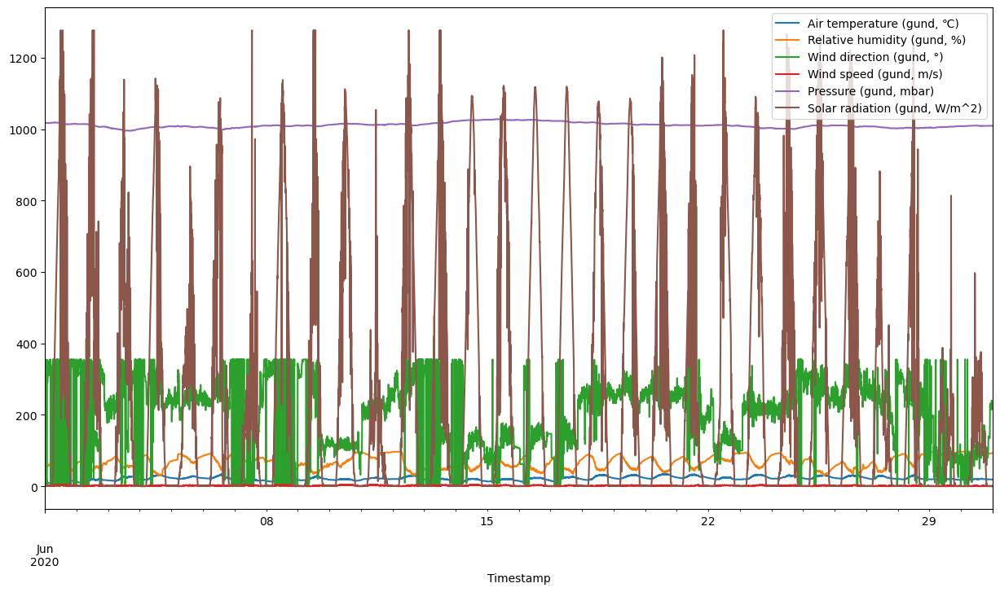

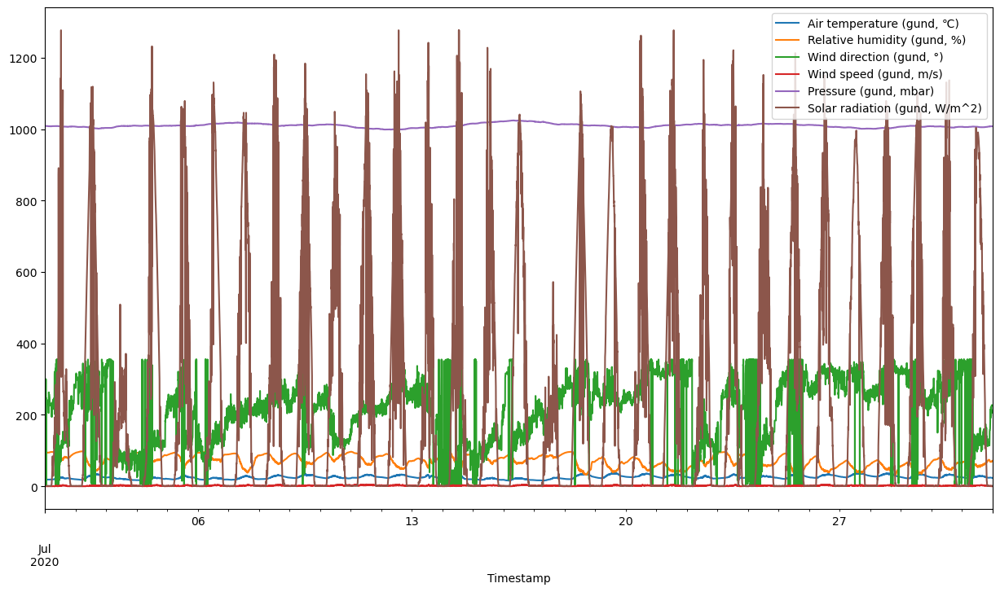

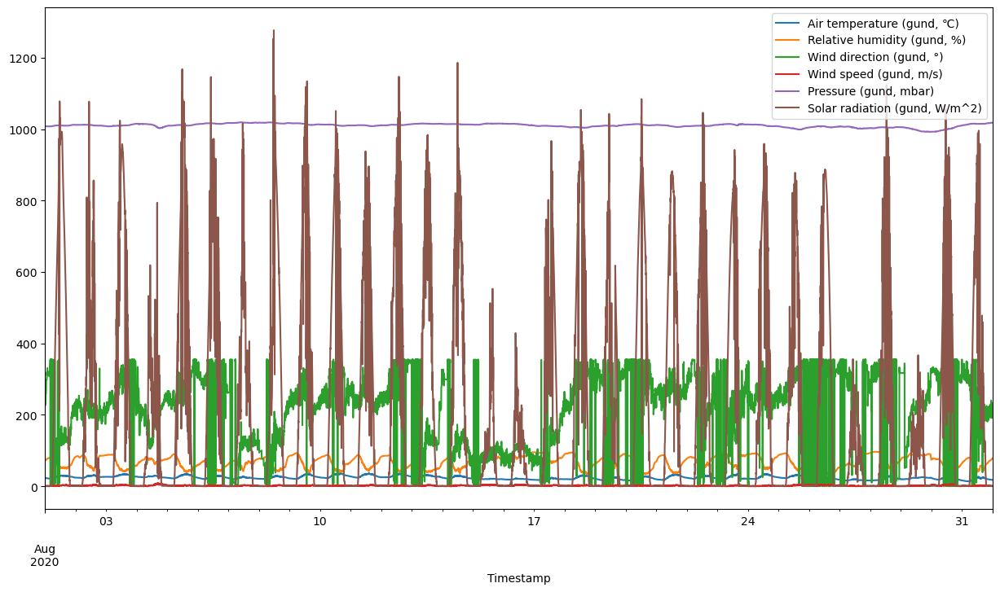

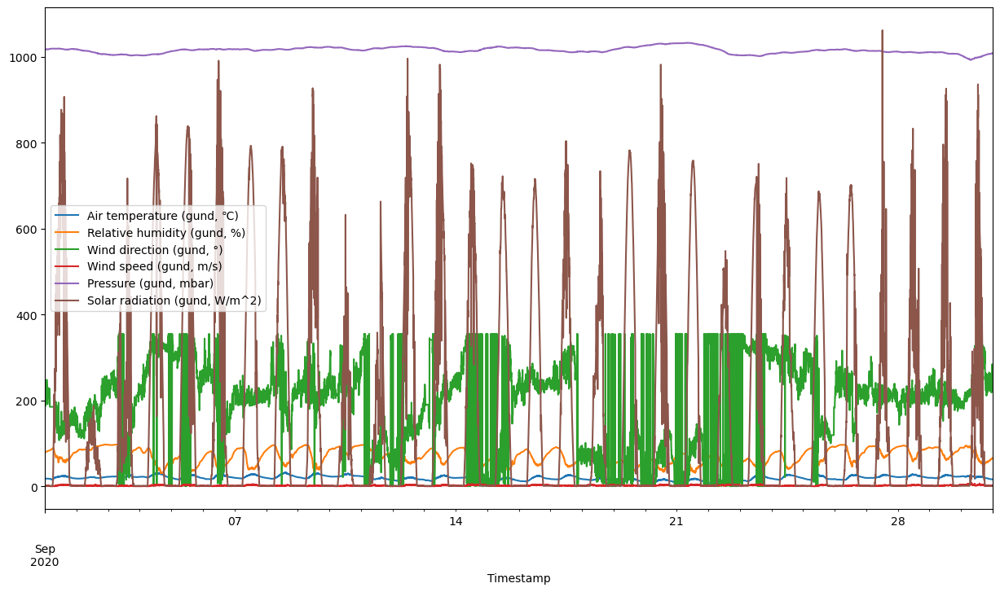

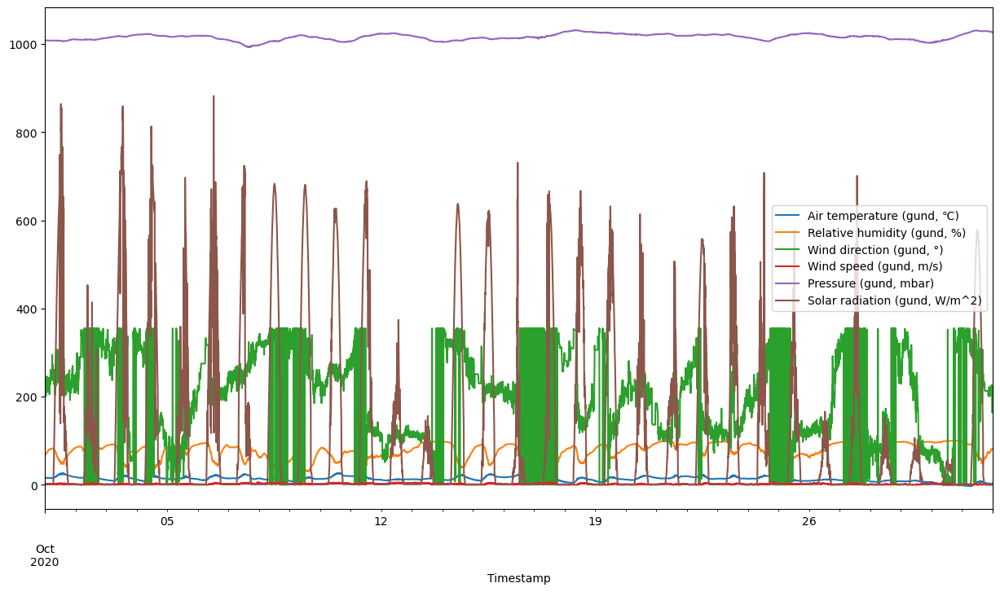

...

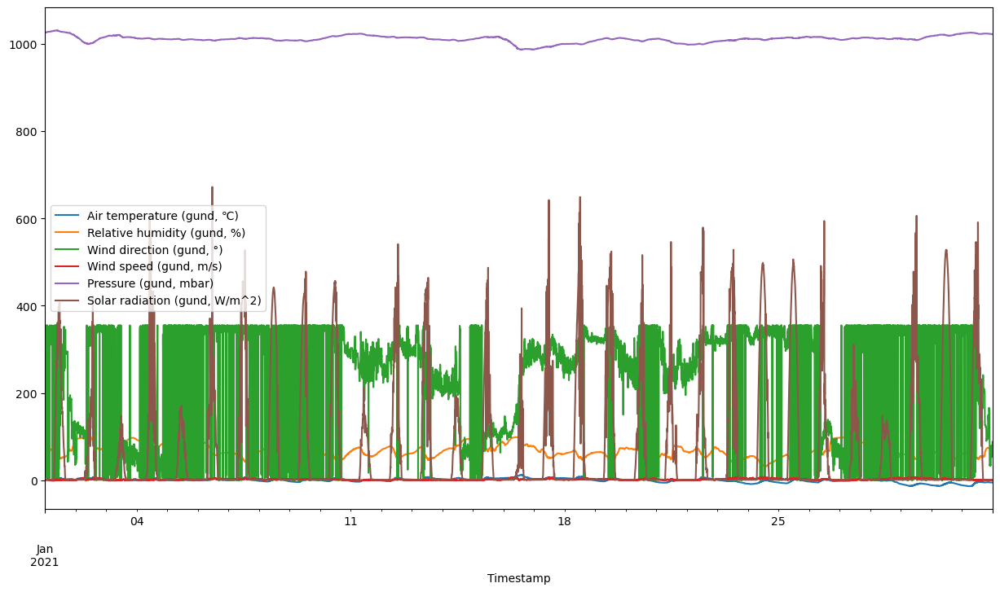

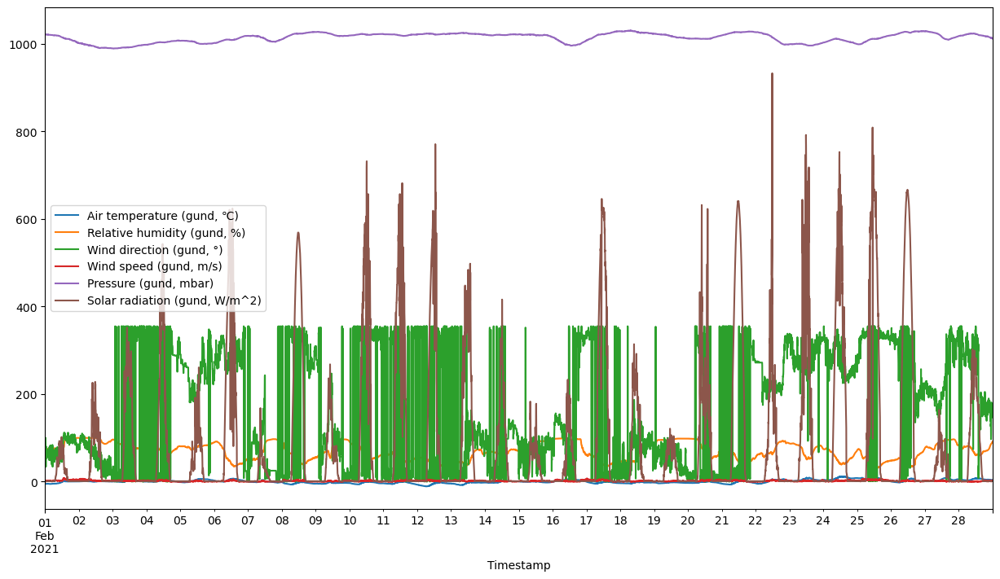

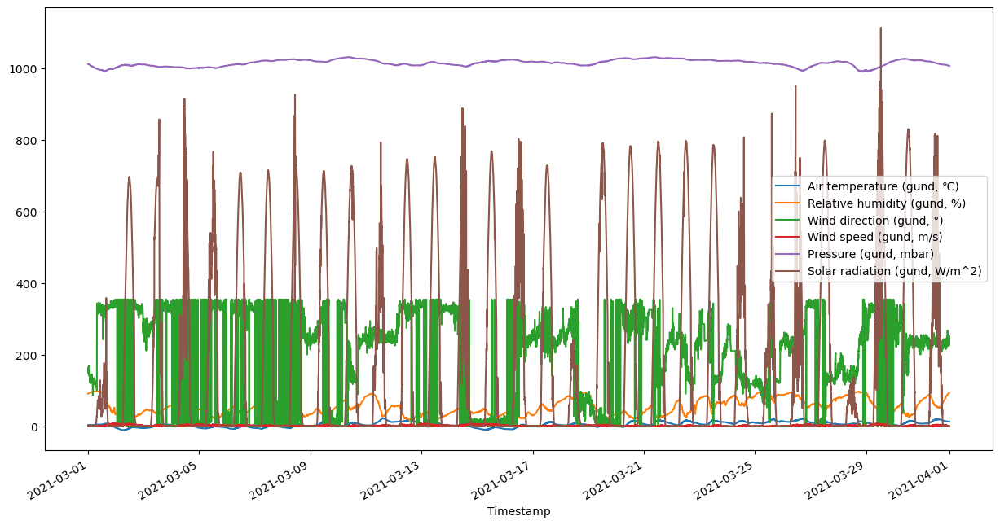

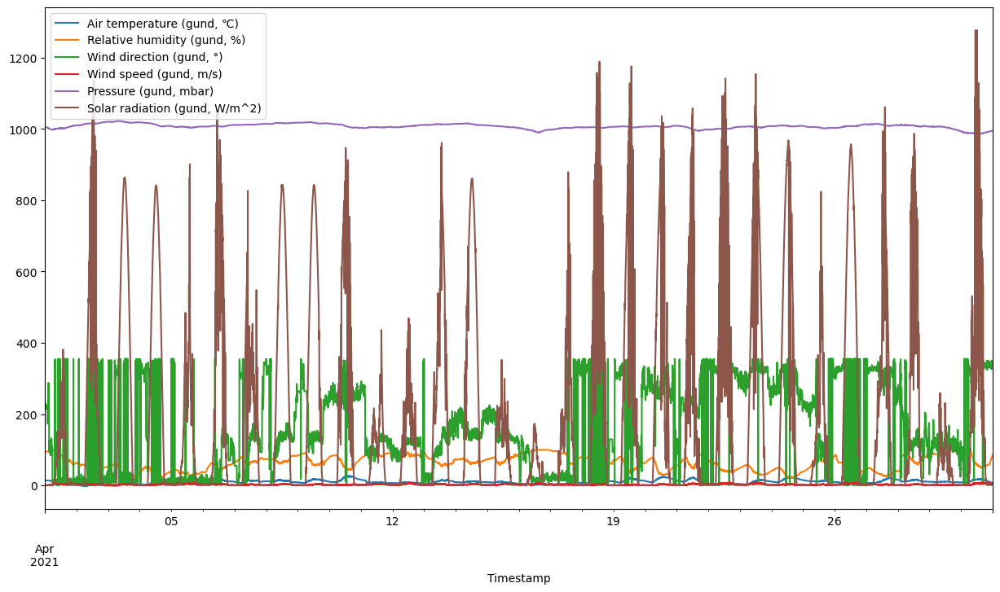

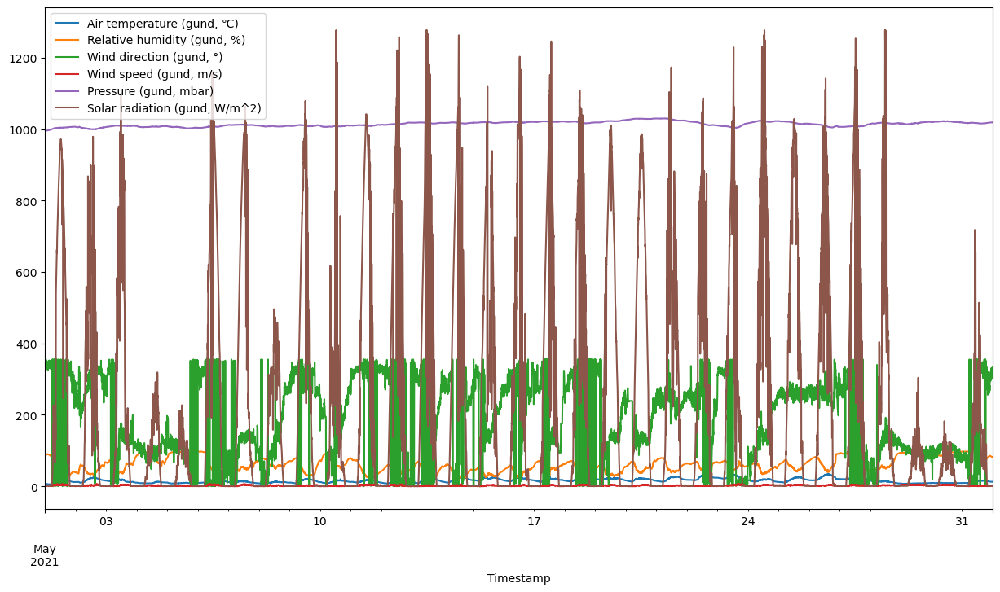

In [10]:
for (year, month), group in yearly_data.groupby([yearly_data.index.year, yearly_data.index.month]):

    group.plot(figsize=(15, 8))

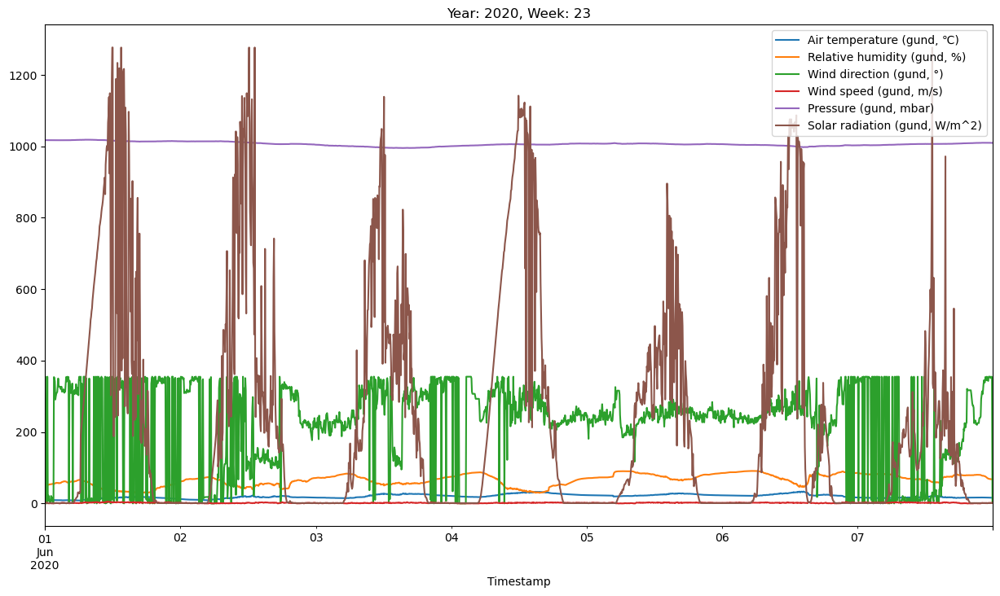

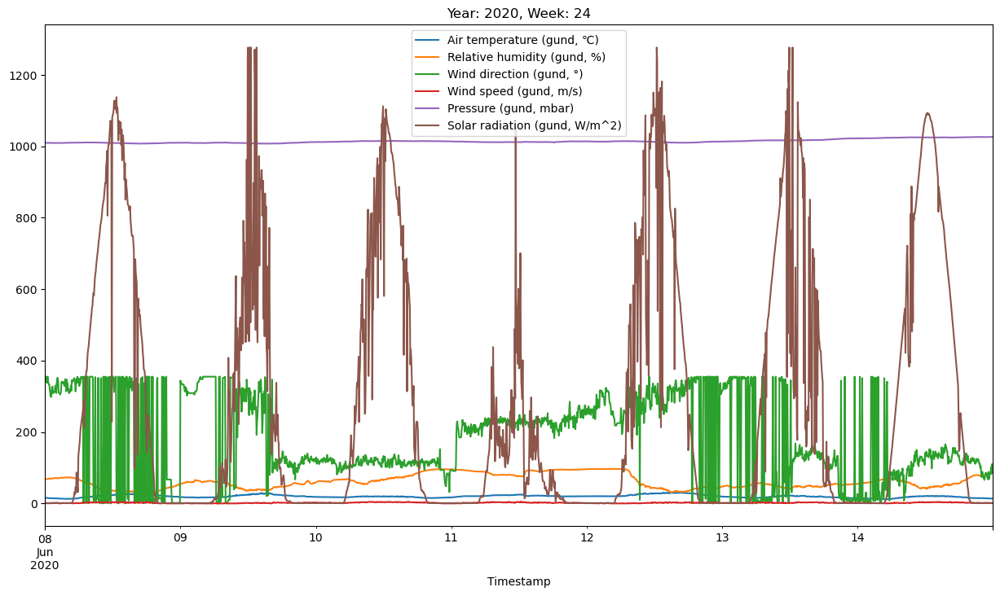

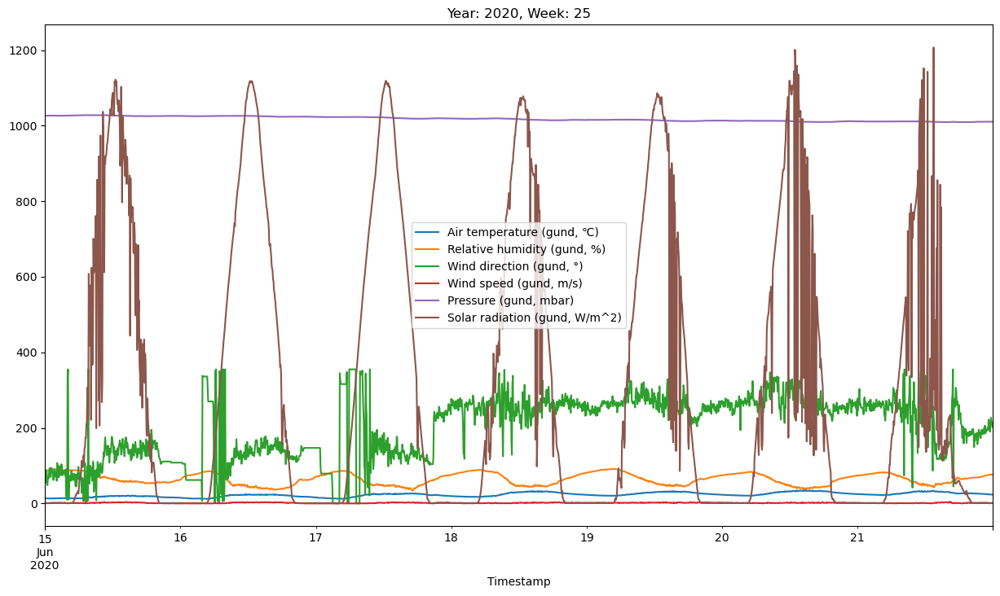

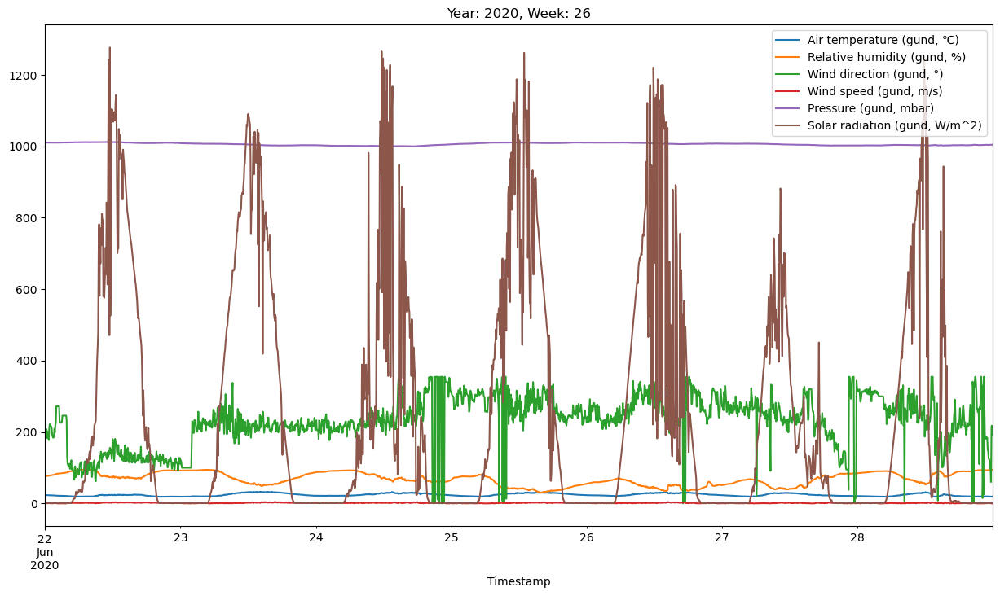

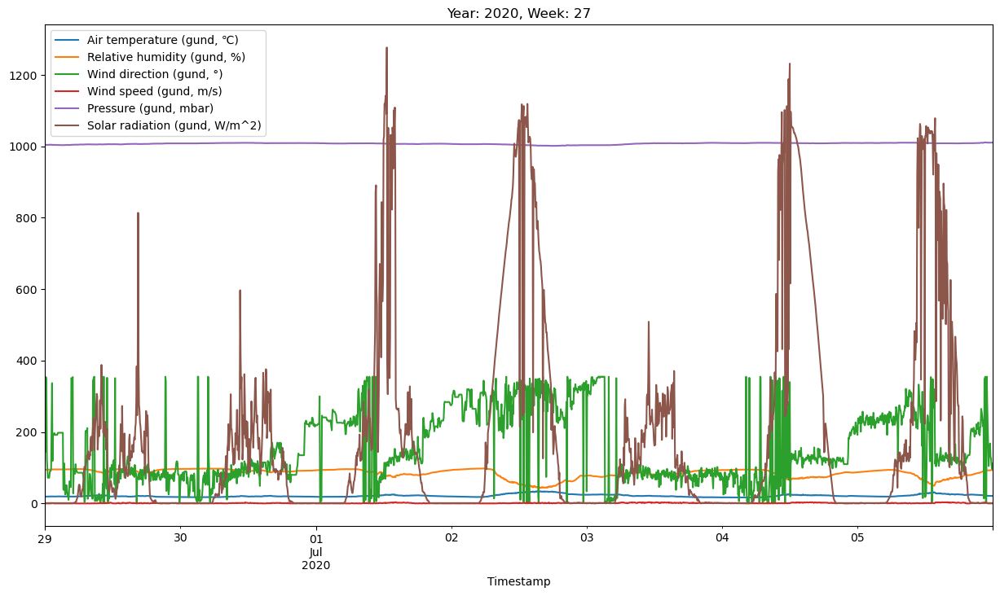

...

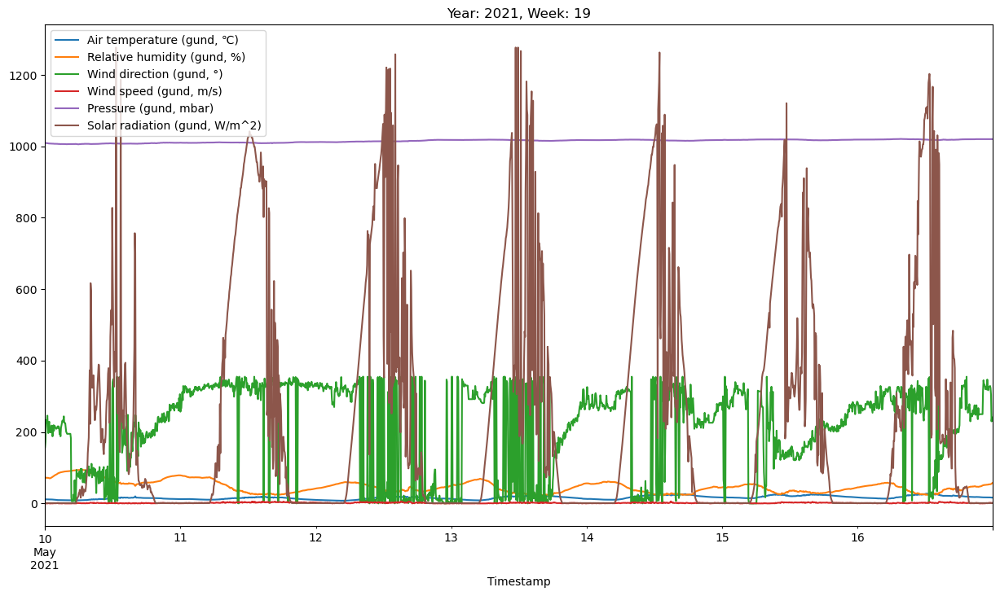

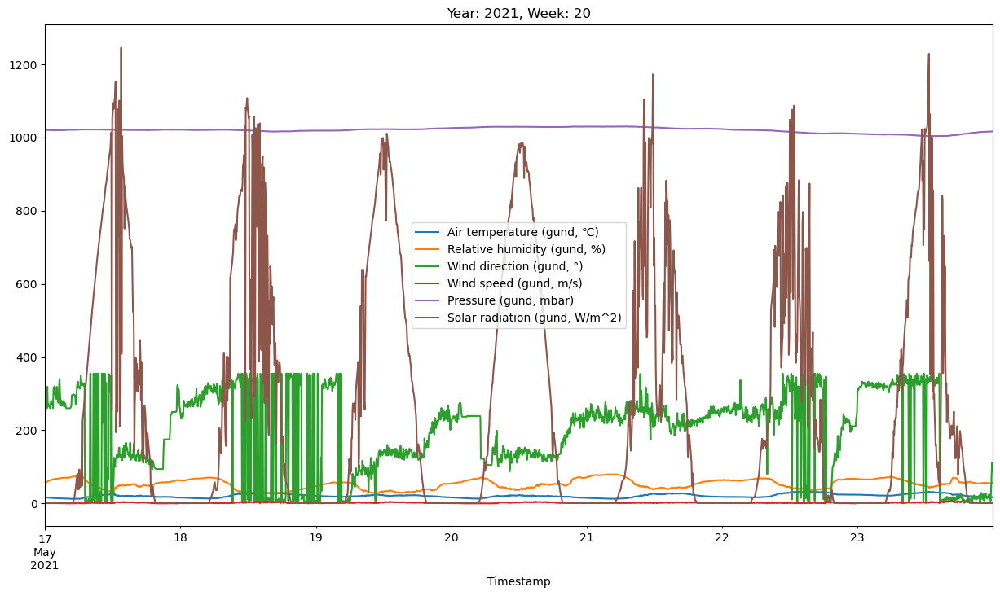

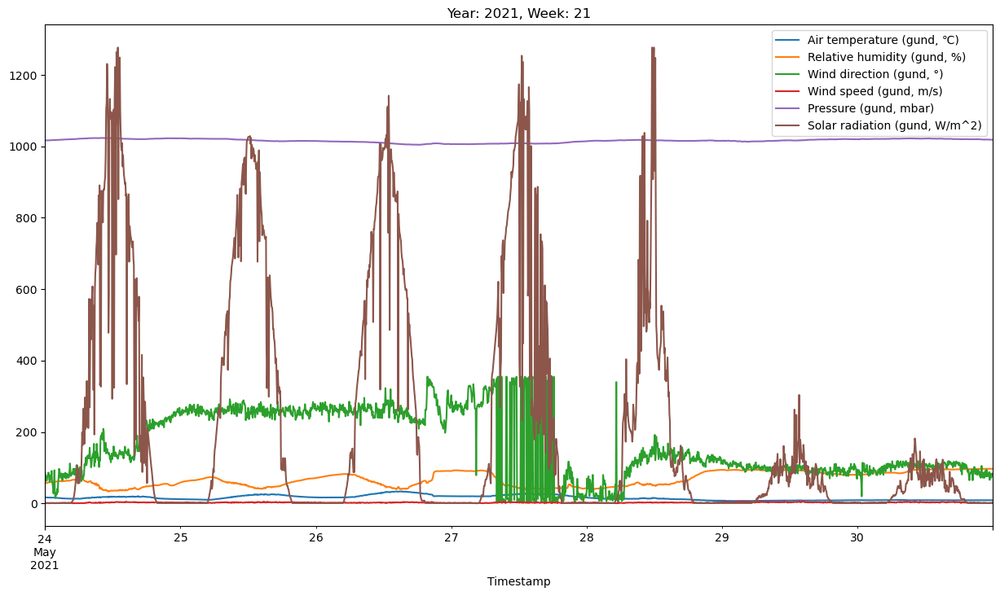

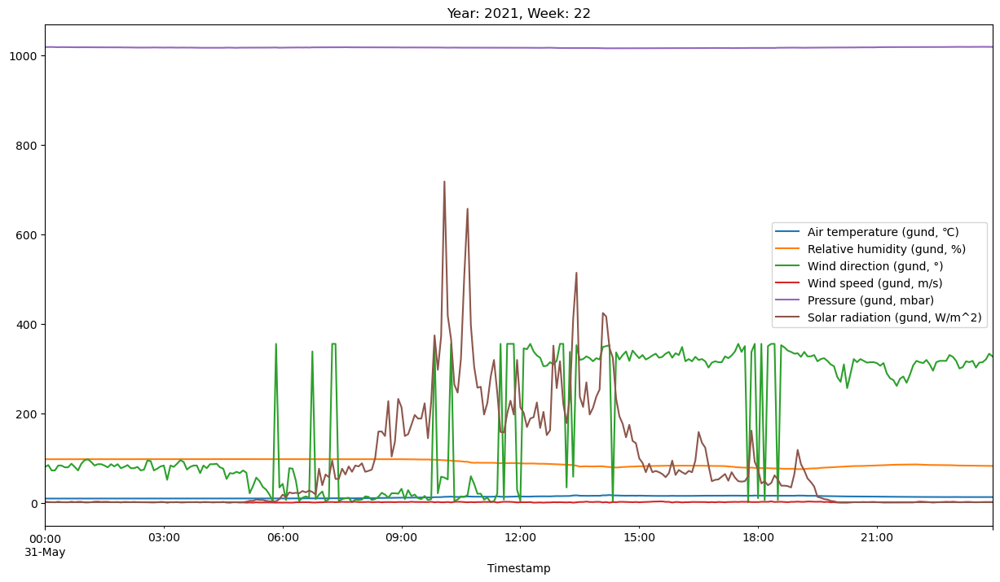

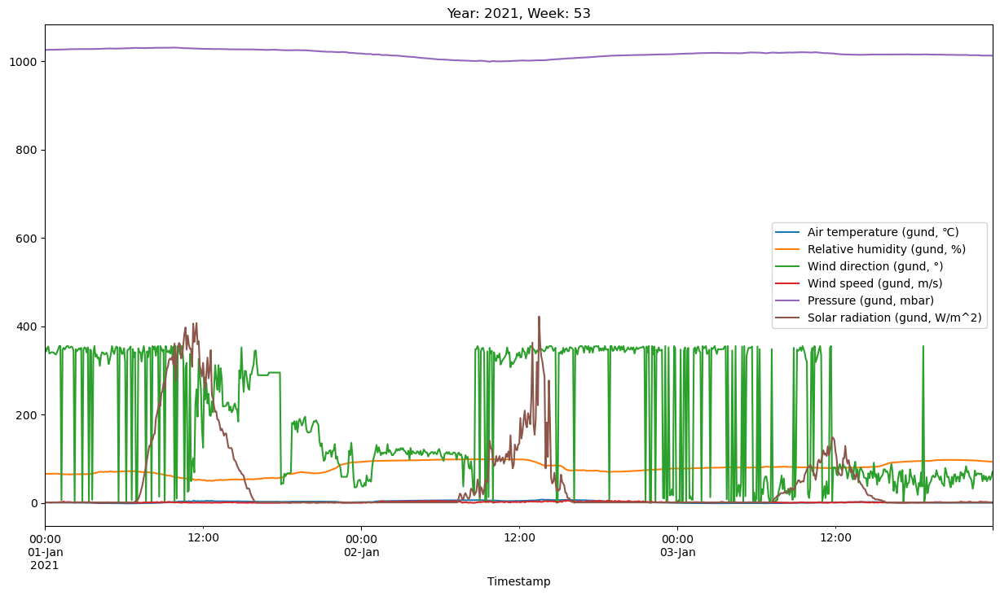

In [11]:
for (year, week), group in yearly_data.groupby([yearly_data.index.year, yearly_data.index.isocalendar().week]):
    # Plot each group
    group.plot(figsize=(15, 8))
    plt.title(f'Year: {year}, Week: {week}')
    plt.show()

In [17]:
yearly_data = yearly_data.resample("H").mean().pad()
yearly_data

C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\279364562.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  yearly_data = yearly_data.resample("H").mean().pad()
C:\Users\Sang\AppData\Local\Temp\ipykernel_31660\279364562.py:1: FutureWarning: DataFrame.pad/Series.pad is deprecated. Use DataFrame.ffill/Series.ffill instead
  yearly_data = yearly_data.resample("H").mean().pad()


,"Air temperature (gund, ℃)","Relative humidity (gund, %)","Wind direction (gund, °)","Wind speed (gund, m/s)","Pressure (gund, mbar)","Solar radiation (gund, W/m^2)"
Timestamp,,,,,,
2022-06-01 00:00:00,12.576667,88.250000,98.583333,0.208333,1013.658333,1.000000
2022-06-01 01:00:00,12.975833,89.908333,111.083333,0.000000,1013.608333,1.000000
2022-06-01 02:00:00,13.330833,90.491667,98.333333,0.000000,1013.491667,1.000000
2022-06-01 03:00:00,13.648333,87.258333,84.166667,0.250000,1013.133333,1.000000
2022-06-01 04:00:00,13.836667,80.758333,85.833333,0.166667,1013.200000,1.000000
...,...,...,...,...,...,...
2023-05-31 19:00:00,24.827500,41.050000,132.000000,1.458333,1015.191667,51.416667
2023-05-31 20:00:00,22.230833,48.516667,134.250000,1.333333,1015.525000,1.416667
2023-05-31 21:00:00,19.980833,60.800000,143.000000,1.583333,1016.183333,1.000000


In [18]:
missing_percentage = yearly_data.isna().mean() * 100

# Print the result
print(missing_percentage)

Air temperature (gund, ℃)        0.0
Relative humidity (gund, %)      0.0
Wind direction (gund, °)         0.0
Wind speed (gund, m/s)           0.0
Pressure (gund, mbar)            0.0
Solar radiation (gund, W/m^2)    0.0
dtype: float64


In [19]:
yearly_data.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Desigo\Year3\Gund_Weather_Year3.csv', index=True)